In [1]:
# In this script I want to solve the system of odes for assembling two 3-membered rings  
# with synthesis and degradation NOT included 
# Name: Leo Lagunes and Paige M.
# Date: 07/14/21 

# Last update: 11/24/21

# IMPORTANT NOTE: The equations were written and developed by Drs. Eric Deeds and Koan Briggs, this code was developed by LL + PM

#skip this cell if you've run it before
#import Pkg; Pkg.precompile()
#Pkg.add("Plots")
#using Pkg
#using Plots; gr()
#Pkg.add("DifferentialEquations")
#using DifferentialEquations

#println("Almost ready!")
#Pkg.update()
#ENV["GRDIR"]=""
#Pkg.build("GR")
#println("Ready bitch!")
#println("............")

In [1]:
# This cell contains all the functions + packages to run everything

#------------------------------------
#--- List of packages here ---
#------------------------------------
using DifferentialEquations
using Plots; gr()
# -----------------------------------
# --- Solve the system of ode's -----
# -----------------------------------

function StackedRings_EJD(paramvaluesList)
    x0Val, kOn, δ, Q, kd1, kd2 = paramvaluesList
    p = kOn, δ, Q
    keff(i,j)= kOn*(kd1)^i*(kd2)^j*ℯ^(-(i+j-1)*9/0.6)
    function TwoStackedRingsSystem!(dx, x, p, t)
        dx[1] = - 2*kOn*0.5*x[1]*x[1] + 1*keff(1,0)*x[2] - 2*kOn*0.5*x[1]*x[1] + 1*keff(1,0)*x[2] - 1*kOn*0.5*x[1]*x[1] + 1*keff(0,1)*x[3] - 1*kOn*0.5*x[1]*x[1] + 1*keff(0,1)*x[3] - 1*kOn*1*x[1]*x[2] + 3*keff(2,0)*x[4] - 1*kOn*1*x[1]*x[2] + 1*keff(0,1)*x[5] - 1*kOn*1*x[1]*x[2] + 1*keff(0,1)*x[6] - 2*kOn*1*x[1]*x[3] + 1*keff(1,0)*x[6] - 2*kOn*1*x[1]*x[3] + 1*keff(1,0)*x[5] - 3*kOn*1*x[1]*x[4] + 1*keff(0,1)*x[7] - 1*kOn*1*x[1]*x[5] + 1*keff(2,0)*x[7] - 1*kOn*1*x[1]*x[5] + 2*keff(1,0)*x[8] - 1*kOn*1*x[1]*x[5] + 2*keff(1,1)*x[9] - 1*kOn*1*x[1]*x[6] + 1*keff(2,0)*x[7] - 1*kOn*1*x[1]*x[6] + 2*keff(1,1)*x[9] - 1*kOn*1*x[1]*x[6] + 2*keff(1,0)*x[10] - 2*kOn*1*x[1]*x[7] + 2*keff(1,1)*x[11] - 2*kOn*1*x[1]*x[8] + 1*keff(2,1)*x[11] - 2*kOn*1*x[1]*x[9] + 1*keff(2,0)*x[11] - 2*kOn*1*x[1]*x[10] + 1*keff(2,1)*x[11] - 1*kOn*1*x[1]*x[11] + 6*keff(2,1)*x[12]   
        dx[2] = + 2*kOn*0.5*x[1]*x[1] - 1*keff(1,0)*x[2] - 1*kOn*1*x[1]*x[2] + 3*keff(2,0)*x[4] - 1*kOn*1*x[1]*x[2] + 1*keff(0,1)*x[5] - 1*kOn*1*x[1]*x[2] + 1*keff(0,1)*x[6] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,2)*x[9] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,2)*x[9] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,1)*x[10] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,1)*x[10] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,1)*x[8] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,1)*x[8] - 2*kOn*1*x[2]*x[3] + 1*keff(2,0)*x[7] - 3*kOn*1*x[2]*x[4] + 1*keff(0,2)*x[11] - 1*kOn*1*x[2]*x[5] + 1*keff(2,1)*x[11] - 1*kOn*1*x[2]*x[6] + 1*keff(2,1)*x[11] - 1*kOn*1*x[2]*x[7] + 6*keff(2,2)*x[12]
        dx[3] = + 1*kOn*0.5*x[1]*x[1] - 1*keff(0,1)*x[3] - 2*kOn*1*x[1]*x[3] + 1*keff(1,0)*x[6] - 2*kOn*1*x[1]*x[3] + 1*keff(1,0)*x[5] - 2*kOn*1*x[2]*x[3] + 1*keff(2,0)*x[7] - 4*kOn*0.5*x[3]*x[3] + 1*keff(2,0)*x[9] - 4*kOn*0.5*x[3]*x[3] + 1*keff(2,0)*x[9] - 2*kOn*1*x[3]*x[5] + 1*keff(3,0)*x[11] - 2*kOn*1*x[3]*x[6] + 1*keff(3,0)*x[11] - 2*kOn*1*x[3]*x[9] + 3*keff(4,0)*x[12]  
        dx[4] = + 1*kOn*1*x[1]*x[2] - 3*keff(2,0)*x[4] - 3*kOn*1*x[1]*x[4] + 1*keff(0,1)*x[7] - 3*kOn*1*x[2]*x[4] + 1*keff(0,2)*x[11] - 3*kOn*0.5*x[4]*x[4] + 1*keff(0,3)*x[12] - 3*kOn*0.5*x[4]*x[4] + 1*keff(0,3)*x[12]  
        dx[5] = + 1*kOn*1*x[1]*x[2] - 1*keff(0,1)*x[5] + 2*kOn*1*x[1]*x[3] - 1*keff(1,0)*x[5] - 1*kOn*1*x[1]*x[5] + 1*keff(2,0)*x[7] - 1*kOn*1*x[1]*x[5] + 2*keff(1,0)*x[8] - 1*kOn*1*x[1]*x[5] + 2*keff(1,1)*x[9] - 1*kOn*1*x[2]*x[5] + 1*keff(2,1)*x[11] - 2*kOn*1*x[3]*x[5] + 1*keff(3,0)*x[11] - 1*kOn*0.5*x[5]*x[5] + 3*keff(4,1)*x[12] - 1*kOn*0.5*x[5]*x[5] + 3*keff(4,1)*x[12]    
        dx[6] = + 1*kOn*1*x[1]*x[2] - 1*keff(0,1)*x[6] + 2*kOn*1*x[1]*x[3] - 1*keff(1,0)*x[6] - 1*kOn*1*x[1]*x[6] + 1*keff(2,0)*x[7] - 1*kOn*1*x[1]*x[6] + 2*keff(1,1)*x[9] - 1*kOn*1*x[1]*x[6] + 2*keff(1,0)*x[10] - 1*kOn*1*x[2]*x[6] + 1*keff(2,1)*x[11] - 2*kOn*1*x[3]*x[6] + 1*keff(3,0)*x[11] - 1*kOn*0.5*x[6]*x[6] + 3*keff(4,1)*x[12] - 1*kOn*0.5*x[6]*x[6] + 3*keff(4,1)*x[12]     
        dx[7] = + 3*kOn*1*x[1]*x[4] - 1*keff(0,1)*x[7] + 1*kOn*1*x[1]*x[5] - 1*keff(2,0)*x[7] + 1*kOn*1*x[1]*x[6] - 1*keff(2,0)*x[7] - 2*kOn*1*x[1]*x[7] + 2*keff(1,1)*x[11] + 2*kOn*1*x[2]*x[3] - 1*keff(2,0)*x[7] - 1*kOn*1*x[2]*x[7] + 6*keff(2,2)*x[12]  
        dx[8] = + 1*kOn*1*x[1]*x[5] - 2*keff(1,0)*x[8] - 2*kOn*1*x[1]*x[8] + 1*keff(2,1)*x[11] + 1*kOn*0.5*x[2]*x[2] - 1*keff(0,1)*x[8]  
        dx[9] = + 1*kOn*1*x[1]*x[5] - 2*keff(1,1)*x[9] + 1*kOn*1*x[1]*x[6] - 2*keff(1,1)*x[9] - 2*kOn*1*x[1]*x[9] + 1*keff(2,0)*x[11] + 1*kOn*0.5*x[2]*x[2] - 1*keff(0,2)*x[9] + 4*kOn*0.5*x[3]*x[3] - 1*keff(2,0)*x[9] - 2*kOn*1*x[3]*x[9] + 3*keff(4,0)*x[12]   
        dx[10] = + 1*kOn*1*x[1]*x[6] - 2*keff(1,0)*x[10] - 2*kOn*1*x[1]*x[10] + 1*keff(2,1)*x[11] + 1*kOn*0.5*x[2]*x[2] - 1*keff(0,1)*x[10]  
        dx[11] = + 2*kOn*1*x[1]*x[7] - 2*keff(1,1)*x[11] + 2*kOn*1*x[1]*x[8] - 1*keff(2,1)*x[11] + 2*kOn*1*x[1]*x[9] - 1*keff(2,0)*x[11] + 2*kOn*1*x[1]*x[10] - 1*keff(2,1)*x[11] - 1*kOn*1*x[1]*x[11] + 6*keff(2,1)*x[12] + 3*kOn*1*x[2]*x[4] - 1*keff(0,2)*x[11] + 1*kOn*1*x[2]*x[5] - 1*keff(2,1)*x[11] + 1*kOn*1*x[2]*x[6] - 1*keff(2,1)*x[11] + 2*kOn*1*x[3]*x[5] - 1*keff(3,0)*x[11] + 2*kOn*1*x[3]*x[6] - 1*keff(3,0)*x[11]  
        dx[12] = 1*kOn*1*x[1]*x[11] - 6*keff(2,1)*x[12] + 1*kOn*1*x[2]*x[7] - 6*keff(2,2)*x[12] + 2*kOn*1*x[3]*x[9] - 3*keff(4,0)*x[12] + 3*kOn*0.5*x[4]*x[4] - 1*keff(0,3)*x[12] + 1*kOn*0.5*x[5]*x[5] - 3*keff(4,1)*x[12] + 1*kOn*0.5*x[6]*x[6] - 3*keff(4,1)*x[12]
    end
    x0=[x0Val; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0]
    
    # --- time span ---
    tspan = (0.001, 10.0^9)
    # tspan = (0.000001, 10.0^9)
    # tspan = (0.000001, 10.0^12)
    #tspan = (0.000001, 86400)

    # --- ode solver --- 
    #println("---")
    #println("Solving - fixed parameter set...")
    prob = ODEProblem(TwoStackedRingsSystem!,x0,tspan,p)
    sol = solve(prob,Rosenbrock23(autodiff=false), abstol = 1e-12, reltol = 1e-12);
    #sol = solve(prob,RadauIIA5(autodiff=false), abstol = 1e-12, reltol = 1e-12);
    # sol = solve(prob,TRBDF2());
    #println("Solved ")
    return sol
end

println("Solve Differential Equations: StackedRings_EJD(paramvaluesList)")
#-----------------------
# --- Assembly Yeild ---
#-----------------------
function assemblyYield(solRaw)
    # this function will return the assembly yield value at the last time point 
    # Yn = n*Xn/XT
    #print(sol.u)
    Yn = 0 
    sol=solRaw
    n=12; #XN = sol(end,:); println(XN)
    listSol=[t.+2u for (u,t) in zip(sol.u,sol.t)];
    # This will give the concentratiions of each species at time point 0.01 
    #sol(0.01)
    tEnd = 10^6; t0 = 0.0
    #print(solRaw)
     # NEED THE AY AFTER 24HRS = 86400 seconds!!!!
    timePts = solRaw.t; totPts = length(timePts);
    allSols = solRaw.u; #print(allSols)
    slntEnd_pre = allSols[totPts,:]; slntEnd = slntEnd_pre[1]
    # --- calculate Xn = X12 ---
    nSpec = length(slntEnd); 
    Xn = slntEnd[nSpec]
    # --- calculate XT --- 
    cnt = 1; XT = 0
    for it in slntEnd
        addIt = cnt*it
        XT += addIt
        cnt += 1
    end
    # --- calculate Yn ---
    Yn = n*Xn/XT;
    
    return Yn
    
end

println("get AY w/ last time point: assemblyYield(solRaw)")
#-----------------------------------
# --- Assembly Yeild after 24 hrs---
#-----------------------------------
function assemblyYield_24hrs(solRaw, x0Val)
    # this function will return the assembly yield value after 24hrs! 
    # Yn = n*Xn/XT
    #print(sol.u)
    Yn = 0 
    sol=solRaw
    n=6; #XN = sol(end,:); println(XN)
    listSol=[t.+2u for (u,t) in zip(sol.u,sol.t)];
    # --- take the concentrations at the end of 24hrs = 86400 sec ---
    t24 = sol(86400); # print(t24)
    # This will give the concentratiions of each species at time point 0.01 
    #sol(0.01)
     # NEED THE AY AFTER 24HRS = 86400 seconds!!!!
    allSols = t24; #print(allSols)
    slntEnd=allSols;
    #slntEnd_pre = allSols[totPts,:]; slntEnd = slntEnd_pre[1]
    # --- calculate Xn = X12 ---
    nSpec = length(allSols); #print("species: ", nSpec)
    Xn = allSols[nSpec]; #print("X12: ", Xn)
    # --- calculate XT --- 
    # define XT as the IC of monomers (predefined - compare them-maybe Xn)
    XT = x0Val; # print(XT)
    # --- calculate Yn ---
    Yn = n*Xn/XT;
    
    return Yn
    
end
println("get AY after 24hrs: assemblyYield_24hrs(solRaw)")
#-----------------------------
# --- plot the time course ---
#-----------------------------
function plotTimeCourse(sol,AY)
    # sol = stackedRings_sd(paramvaluesList)
    # This function will plot the time course for the solved odes and label the AY at the last time point
    AYrnd = round(AY,digits=5)
    p1=plot(sol,linewidth=2,title="Stacked rings + synth/deg with AY= $AYrnd",xaxis = ("Time (t)",:log ),
         yaxis="x(t)", label = ["x1" "x2" "x3" "x4" "x5" "x6" "x7" "x8" "x9" "x10" "x11" "x12"] ) # legend=false
    # add a line at 1
    # hline!(p1, value = 1, strokeDash = 1, xaxis =:log)
    display(p1)
    println("Plot done!")

    # sol.t[end],sol[end]
    println("Saving file...")
    #savefig("C:\\plot_2SR_0720_001.png")
    println("Figure saved")
    
end 

println("to get time course: plotTimeCourse(sol, AY)")

#-----------------------
# --- AY time course ---
#-----------------------

function AYtimeCourse(solRaw)
    #This function will return the Assembly yield for every time point in a time course for the last species x12
    # --- empty list/initialization --- #
    list_AY=[]
    Yn = 0 
    sol=solRaw
    n=12; #XN = sol(end,:); println(XN)
    listSol=[t.+2u for (u,t) in zip(sol.u,sol.t)];
    # This will give the concentratiions of each species at time point 0.01 
    #sol(0.01)
    tEnd = 10^6; t0 = 0.0
    #print(solRaw)
    timePts = solRaw.t; totPts = length(timePts); # print("total time points: ", totPts)
    allSols = solRaw.u; #print(allSols)
    for tp_i = 1:totPts
        #println("item in loop: ")
        # print("time: ", tp_i, "\n")
        #print(tp_i)
        # slntEnd_pre = allSols[totPts,:]; slntEnd = slntEnd_pre[1]
        # NEED THE AY AFTER 24HRS = 86400 seconds! 
        slntEnd_pre = allSols[tp_i,:]; #slntEnd = slntEnd_pre[1]
        slntEnd = slntEnd_pre[1]
        # --- calculate Xn = X12 ---
        nSpec = length(slntEnd); 
        Xn = slntEnd[nSpec]
        # --- calculate XT --- 
        cnt = 1; XT = 0
        for it in slntEnd
            addIt = cnt*it
            XT += addIt
            cnt += 1
        end
        # --- calculate Yn ---
        Yn = n*Xn/XT; # add this to the AY list
        # print("AY at ti= ", Yn)
        push!(list_AY, Yn)
    end 
    # print("all tps: ", timePts)
    return list_AY, timePts   
end

println("AY Time course: AYtimecourse(solRaw)")

#----------------------------
# --- plot AY time course ---
#----------------------------
function plotAYtimeCourse(list_AY, timePts)
    # print("total pts: ", length(timePts), "\n")
    #print("--")
    # this function will plot the AY time course give the AY list and the time points 
    p2=plot(timePts,list_AY,linewidth=2,title="Stacked rings Assembly Yield + NO synth/deg",xaxis = ("Time (t)",:log ),
         yaxis="AY(t)", label = ["x12"], legend=:bottomright ) # legend=false
    # add a vertical line at 24hrs mark
    plot!([86400, 86400], [0, 1])
    # hline!(p1, value = 1, strokeDash = 1, xaxis =:log)
    display(p2)
    println("Plot done!")

    # sol.t[end],sol[end]
    #println("Saving file...")
    #savefig("C:\\plot_2SR_0816_AY_001.png")
    #println("Figure saved")
    return p2
    
end 

println("to plot time course: plotAYtimeCourse(list_AY, timePts)")

#----------------------------
# --- calculate AY vs IC  ---
#----------------------------
function calcAYvsIC(nICpts,minDeg, maxDeg)
    # this function will calculate AY for different initial condition values at each time point but only for the x12 species 
    # nICpts = number of initial condition points to consider
    mags = LinRange(minDeg, maxDeg,nICpts)
    allICs = 10 .^mags
    # allICs = [10^-8, 10^-5, 10^-3]

    # initialize lists to store
    AY_list = []; solsList = []
    # loop to solve AY for each IC 
    for icVal in allICs # loop through all the IC values
        #x0Val=10^-4; 
        x0Val=icVal; #print(x0Val)
        # solve the system
        paramvaluesList= x0Val, kOn, δ, Q, kd1, kd2
        # sol = StackedRings_sd(paramvaluesList);
        sol = StackedRings_EJD(paramvaluesList);
        # calculate AY 
        ayVali = assemblyYield_24hrs(sol, x0Val); #print(ayVali)
        # store value of AY 
        push!(AY_list, ayVali)
        # print("AY: ", ayVali)
    end 
    
    return allICs, AY_list
    
end 
println("to calculate AY vs IC: calcAYvsIC(nICpts)")

#----------------------------
# --- plot AY vs IC curve ---
#----------------------------
function plotAYvsIC_curve(allICs, AY_list)
    # This function will plot the AY for increasing Initial Conditions 
    p3=plot(allICs,AY_list,linewidth=2, linecolor=:red,title="Stacked rings Assembly Yield vs Initial Conditions",xaxis = ("Initial Concentration (M)",:log ),
         yaxis="Assembly Yield",legend=false ) # legend=false
    # add a line at 1
    # hline!(p1, value = 1, strokeDash = 1, xaxis =:log)
    display(p3)
    println("Plot done!")

    # sol.t[end],sol[end]
    #println("Saving file...")
    #savefig("C:\\plot_ICvsAY_0824.png")
    #println("Figure saved")
end 
# println("to plot AY vs IC: plotAYvsIC_curve(allICs, AY_list)")
println("to plot AY vs IC: plotAYvsIC_curve(allICs, AY_list)")

Solve Differential Equations: StackedRings_EJD(paramvaluesList)
get AY w/ last time point: assemblyYield(solRaw)
get AY after 24hrs: assemblyYield_24hrs(solRaw)
to get time course: plotTimeCourse(sol, AY)
AY Time course: AYtimecourse(solRaw)
to plot time course: plotAYtimeCourse(list_AY, timePts)
to calculate AY vs IC: calcAYvsIC(nICpts)
to plot AY vs IC: plotAYvsIC_curve(allICs, AY_list)


In [2]:
# EJD Matrix - 11/09/21

matrix1= [0.001   0.997016    0.00197781  0.000987724 3.59332e-06 7.17681e-06 7.17681e-06 8.12767e-08 2.64251e-08 5.28806e-08 2.64251e-08 1.11443e-09 3.09898e-12
0.0015  0.99553 0.00295911  0.00147738  6.61463e-06 1.32101e-05 1.32101e-05 1.58873e-07 5.16761e-08 1.03412e-07 5.16761e-08 2.19945e-09 6.12436e-12
0.00225 0.993305    0.00442549  0.00220879  1.20434e-05 2.40503e-05 2.40503e-05 3.02333e-07 9.83686e-08 1.96852e-07 9.83686e-08 4.21352e-09 1.17433e-11
0.003375    0.989977    0.00661253  0.00329897  2.22044e-05 4.43391e-05 4.43391e-05 5.7842e-07  1.88243e-07 3.76707e-07 1.88243e-07 8.1043e-09  2.26036e-11
0.0050625   0.985013    0.00985397  0.00491264  4.35998e-05 8.70343e-05 8.70343e-05 1.38378e-06 4.52884e-07 9.06032e-07 4.52884e-07 2.7593e-08  1.18214e-10
0.00759375  0.977633    0.0146293   0.0072852   8.92579e-05 0.000178092 0.000178092 3.57977e-06 1.17804e-06 2.35607e-06 1.17804e-06 9.90328e-08 5.96667e-10
0.0113906   0.966713    0.0215928   0.0107346   0.000187521 0.000373781 0.000373781 1.08102e-05 3.57849e-06 7.15442e-06 3.57849e-06 4.58728e-07 4.07555e-09
0.0170859   0.950658    0.0316188   0.0156796   0.00039446  0.000785077 0.000785077 3.33274e-05 1.10768e-05 2.21352e-05 1.10768e-05 2.28431e-06 3.48033e-08
0.0256289   0.927301    0.0457267   0.0225895   0.000834187 0.00165735  0.00165735  9.64207e-05 3.21185e-05 6.41625e-05 3.21185e-05 8.49237e-06 1.52236e-07
0.0384434   0.893824    0.0649584   0.031912    0.00173726  0.00344301  0.00344301  0.000277693 9.26205e-05 0.000184944 9.26205e-05 3.204e-05   7.80383e-07
0.057665    0.846885    0.0899121   0.0438158   0.00352021  0.00695235  0.00695235  0.000782986 0.000261254 0.000521285 0.000261254 0.000122611 4.05148e-06
0.0864976   0.783114    0.120014    0.05783 0.00680884  0.0133806   0.0133806   0.00213136  0.000711154 0.00141773  0.000711154 0.000461523 2.11111e-05
0.129746    0.700374    0.152198    0.0722119   0.0123926   0.024187    0.024187    0.0054417   0.00181458  0.00361437  0.00181458  0.00162215  0.00010137
0.19462 0.59954 0.18044 0.0839022   0.0207399   0.0401024   0.0401024   0.0126605   0.00421542  0.00839461  0.00421542  0.00518923  0.000443124
0.291929    0.486089    0.19746 0.0896802   0.0310925   0.0593536   0.0593536   0.0260907   0.00866261  0.017281    0.00866261  0.0146341   0.00168659
0.437894    0.370039    0.197931    0.0876988   0.0413322   0.077536    0.077536    0.0463197   0.0153003   0.0307262   0.0153003   0.0351457   0.00538408
0.656841    0.263869    0.180858    0.0781945   0.049141    0.0898768   0.0898768   0.0705856   0.0230583   0.0470862   0.0230583   0.0706177   0.0140543
0.985261    0.177908    0.152005    0.0644661   0.0529257   0.0928692   0.0928692   0.093641    0.0298804   0.0632252   0.0298804   0.120409    0.0301936
1.47789 0.116085    0.119156    0.0499859   0.0532939   0.0870701   0.0870701   0.110538    0.0336557   0.0762189   0.0336557   0.17864 0.0548551
2.21684 0.0762409   0.0901645   0.0380836   0.0516454   0.0747999   0.0747999   0.117787    0.0329541   0.0841713   0.0329541   0.23868 0.0879111
3.32526 0.0529494   0.0676841   0.0295004   0.0495271   0.0591379   0.0591379   0.115305    0.0279568   0.0870672   0.0279568   0.295485    0.128654
4.98789 0.0408064   0.0487638   0.0222554   0.048011    0.0431337   0.0431337   0.10551 0.0204453   0.0859117   0.0204453   0.34365 0.178058
7.48183 0.0325117   0.036056    0.0177321   0.0455935   0.0275944   0.0275944   0.0878954   0.0119809   0.0792002   0.0119809   0.384362    0.238413
11.2227 0.0256257   0.0236186   0.0124755   0.0429833   0.0160887   0.0160887   0.0668892   0.00553743  0.068613    0.00553743  0.406675    0.31078
16.8341 0.0192978   0.0139518   0.00812088  0.038724    0.00772148  0.00772148  0.0454406   0.00191701  0.0555572   0.00191701  0.40901 0.39152
25.2512 0.0132236   0.00694641  0.00445098  0.0331017   0.0028543   0.0028543   0.0269531   0.000476281 0.0427533   0.000476281 0.393259    0.473553
37.8768 0.00769544  0.00263743  0.00181719  0.0268594   0.000672601 0.000672601 0.0133072   3.46811e-05 0.0326357   3.46811e-05 0.367829    0.546706
56.8151 0.00435085  0.000832364 0.000616009 0.0199692   0.000160192 0.000160192 0.00541034  0   0.0255241   0   0.339034    0.604847
85.2227 0.00230641  0.000106479 0.000162973 0.0142131   0   0   0.00121993  0   0.0224797   0   0.323541    0.637099
127.834 0   0.000260784 1.46633e-07 0.00914333  5.82891e-05 5.82891e-05 0.000271671 1.92409e-05 0.020902    1.92409e-05 0.317643    0.654105
191.751 0   2.16195e-05 9.70952e-06 0.0058434   0   0   0   0   0.0215034   0   0.321053    0.652512
287.627 1.50726e-05 0   0   0.00363314  0   0   3.15386e-05 6.22533e-07 0.0215379   6.22533e-07 0.321104    0.654615
431.44  0   2.72713e-07 2.68016e-07 0.00238924  1.79954e-07 1.79953e-07 9.01696e-07 0   0.0215893   0   0.321091    0.655832
647.16  5.8825e-07  8.34075e-07 5.06441e-07 0.00152219  0   0   0   0   0.0216  0   0.32109 0.656692
970.74  0   0   0   0.00109173  2.08346e-10 2.08507e-10 1.6786e-07  2.39391e-10 0.0216052   2.39408e-10 0.321111    0.657095
1456.11 5.54757e-09 5.26595e-09 0   0.000835493 7.06103e-11 7.05936e-11 0   0   0.0216059   0   0.321113    0.657348
2184.16 2.01107e-09 1.53409e-09 0   0.000518174 2.68911e-11 2.68826e-11 0   0   0.0216059   0   0.321113    0.657665
3276.25 0   0   4.11662e-12 4.9316e-05  4.40074e-12 4.39934e-12 5.18324e-09 0   0.021606    0   0.321114    0.658133
4914.37 0   0   0   0   0   0   3.67166e-09 8.23061e-13 0.021606    8.23169e-13 0.321114    0.658821
7371.55 0   0   0   0   0   0   1.98191e-09 4.43096e-13 0.021606    4.43154e-13 0.321114    0.659048
11057.3 0   0   0   0   0   0   2.04094e-11 0   0.021606    0   0.321115    0.659319
16586   0   0   1.18559e-15 0   0   0   4.73811e-11 0   0.021606    0   0.321115    0.659318
24879   0   0   1.19289e-15 0   0   0   3.25669e-12 0   0.021606    0   0.321115    0.658909
37318.5 0   0   1.19298e-15 0   0   0   1.52312e-13 0   0.021606    0   0.321115    0.658218
55977.7 1.17644e-14 0   1.19299e-15 0.000406792 0   0   7.522e-14   0   0.021606    0   0.321115    0.657775
83966.6 3.66081e-14 1.50948e-14 1.19299e-15 0.00104473  0   0   0   0   0.021606    0   0.321115    0.657137
125950  3.52199e-14 1.4055e-14  1.19299e-15 0.00101767  0   0   0   0   0.021606    0   0.321115    0.657164
188925  2.87991e-14 9.2461e-15  1.19299e-15 0.000748018 0   0   0   0   0.021606    0   0.321115    0.657434
283387  2.43518e-14 5.9258e-15  1.19299e-15 0.000214098 0   0   1.23312e-14 0   0.021606    0   0.321115    0.657968
425081  2.33121e-14 5.15951e-15 1.19299e-15 0   0   0   1.59734e-14 0   0.021606    0   0.321115    0.658417
637622  2.34276e-14 5.25693e-15 1.19299e-15 0   0   0   1.51069e-14 0   0.021606    0   0.321115    0.65877
956432  2.34303e-14 5.26089e-15 1.19299e-15 0   0   0   1.50248e-14 0   0.021606    0   0.321115    0.658832
1.43465e+06 2.34294e-14 5.25145e-15 1.19299e-15 0   0   0   1.53568e-14 0   0.021606    0   0.321115    0.658546
2.15197e+06 2.34481e-14 5.25191e-15 1.19299e-15 7.8441e-05  0   0   1.57893e-14 0   0.021606    0   0.321115    0.658104
3.22796e+06 2.34758e-14 5.25638e-15 1.19299e-15 0.000612328 0   0   1.62909e-14 0   0.021606    0   0.321115    0.65757
4.84194e+06 2.34953e-14 5.25952e-15 1.19299e-15 0.000986842 0   0   1.66426e-14 0   0.021606    0   0.321114    0.657195
7.26291e+06 2.3498e-14  5.25997e-15 1.19299e-15 0.00103947  0   0   1.6692e-14  0   0.021606    0   0.321114    0.657143
1.08944e+07 2.34782e-14 5.25674e-15 1.19299e-15 0.000660134 0   0   1.6336e-14  0   0.021606    0   0.321114    0.657522
1.63415e+07 2.34445e-14 5.25118e-15 1.19299e-15 1.4318e-05  0   0   1.57302e-14 0   0.021606    0   0.321114    0.658168
2.45123e+07 2.34219e-14 5.24743e-15 1.19299e-15 0   0   0   1.53252e-14 0   0.021606    0   0.321114    0.6586
3.67685e+07 2.34115e-14 5.24572e-15 1.19299e-15 0   0   0   1.514e-14   0   0.021606    0   0.321114    0.658797
5.51527e+07 2.3423e-14  5.2476e-15  1.19299e-15 0   0   0   1.53443e-14 0   0.021606    0   0.321114    0.65858
8.27291e+07 2.34445e-14 5.25117e-15 1.19299e-15 1.43505e-05 0   0   1.57302e-14 0   0.021606    0   0.321114    0.658168
1.24094e+08 2.34683e-14 5.25511e-15 1.19298e-15 0.000469634 0   0   1.61571e-14 0   0.021606    0   0.321113    0.657714
1.8614e+08  2.34911e-14 5.25887e-15 1.19298e-15 0.000905315 0   0   1.65656e-14 0   0.0216059   0   0.321113    0.657279
2.79211e+08 2.34958e-14 5.25964e-15 1.19298e-15 0.000995628 0   0   1.66503e-14 0   0.0216059   0   0.321112    0.657189
4.18816e+08 2.34828e-14 5.25746e-15 1.19298e-15 0.000746253 0   0   1.64163e-14 0   0.0216058   0   0.32111 0.65744
6.28224e+08 2.34544e-14 5.25272e-15 1.19297e-15 0.000203498 0   0   1.59073e-14 0   0.0216056   0   0.321108    0.657985]

68×13 Matrix{Float64}:
 0.001       0.997016     0.00197781   …  1.11443e-9   3.09898e-12
 0.0015      0.99553      0.00295911      2.19945e-9   6.12436e-12
 0.00225     0.993305     0.00442549      4.21352e-9   1.17433e-11
 0.003375    0.989977     0.00661253      8.1043e-9    2.26036e-11
 0.0050625   0.985013     0.00985397      2.7593e-8    1.18214e-10
 0.00759375  0.977633     0.0146293    …  9.90328e-8   5.96667e-10
 0.0113906   0.966713     0.0215928       4.58728e-7   4.07555e-9
 0.0170859   0.950658     0.0316188       2.28431e-6   3.48033e-8
 0.0256289   0.927301     0.0457267       8.49237e-6   1.52236e-7
 0.0384434   0.893824     0.0649584       3.204e-5     7.80383e-7
 0.057665    0.846885     0.0899121    …  0.000122611  4.05148e-6
 0.0864976   0.783114     0.120014        0.000461523  2.11111e-5
 0.129746    0.700374     0.152198        0.00162215   0.00010137
 ⋮                                     ⋱               
 7.26291e6   2.3498e-14   5.25997e-15     0.321114     0.

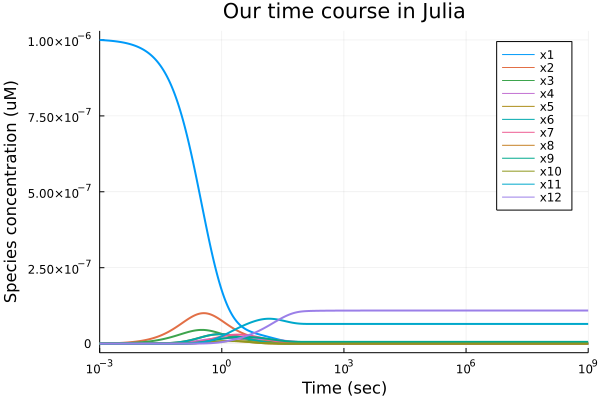

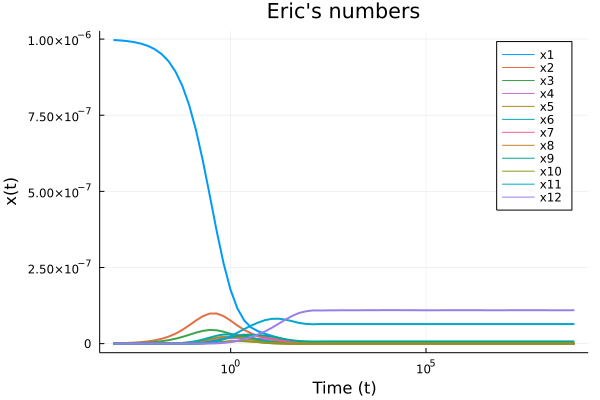

In [3]:
# Convert EJD AY values to [X]
timeVec = matrix1[:,1]
x0Val=10^-6

# Label AY for each species
y1 = matrix1[:,2];y2 = matrix1[:,3];y3 = matrix1[:,4];y4 = matrix1[:,5];y5 = matrix1[:,6]
y6 = matrix1[:,7];y7 = matrix1[:,8];y8 = matrix1[:,9];y9 = matrix1[:,10]
y10 = matrix1[:,11];y11 = matrix1[:,12];y12 = matrix1[:,13];

# Calculate the Xn for each Xn=Xt*Yn/n
x1= x0Val*y1/1;
x2= x0Val*y2/2;
x3= x0Val*y3/2;
x4= x0Val*y4/3;
x5= x0Val*y5/4;
x6= x0Val*y6/3;
x7= x0Val*y7/4;
x8= x0Val*y8/4;
x9= x0Val*y9/3;
x10= x0Val*y10/4;
x11= x0Val*y11/5;
x12= x0Val*y12/6;

# Put matrix back together 
matrix_EJD_x0 = hcat(timeVec, x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12)

# Plot this matrix- EJD
p3=plot((matrix_EJD_x0[:,1],matrix_EJD_x0[:,2:13]),linewidth=2,title="Eric's numbers",xaxis = ("Time (t)",:log ),
yaxis="x(t)", label = ["x1" "x2" "x3" "x4" "x5" "x6" "x7" "x8" "x9" "x10" "x11" "x12"], plotjoined=true) # legend=false

# Plot our current julia time course 
# To compare: 
c0=1 # 1M
kd1 = 10^-7 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-7 #between ring (intra)
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 
x0Val=10^-6

paramvaluesList= x0Val, kOn, δ, Q, kd1, kd2
sol = StackedRings_EJD(paramvaluesList)
p1=plot(sol,linewidth=2,title="Our time course in Julia",xaxis = ("Time (sec)",:log ),
     yaxis="Species concentration (uM)", label = ["x1" "x2" "x3" "x4" "x5" "x6" "x7" "x8" "x9" "x10" "x11" "x12"] ) # legend=false

display(p1)
display(p3)

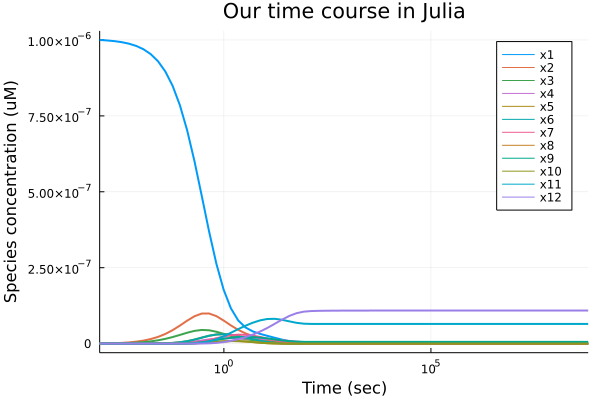

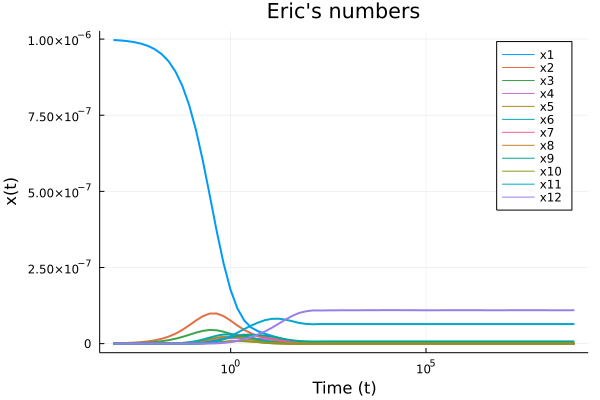

In [4]:
# Compare Julia code vs EJD values

# by passing in the time vector from EJD output 
function StackedRings_EJD_time(paramvaluesList, tVec)
    x0Val, kOn, δ, Q, kd1, kd2 = paramvaluesList
    p = kOn, δ, Q
    keff(i,j)= kOn*(kd1)^i*(kd2)^j*ℯ^(-(i+j-1)*9/0.6)
    function TwoStackedRingsSystem!(dx, x, p, t)
        dx[1] = - 2*kOn*0.5*x[1]*x[1] + 1*keff(1,0)*x[2] - 2*kOn*0.5*x[1]*x[1] + 1*keff(1,0)*x[2] - 1*kOn*0.5*x[1]*x[1] + 1*keff(0,1)*x[3] - 1*kOn*0.5*x[1]*x[1] + 1*keff(0,1)*x[3] - 1*kOn*1*x[1]*x[2] + 3*keff(2,0)*x[4] - 1*kOn*1*x[1]*x[2] + 1*keff(0,1)*x[5] - 1*kOn*1*x[1]*x[2] + 1*keff(0,1)*x[6] - 2*kOn*1*x[1]*x[3] + 1*keff(1,0)*x[6] - 2*kOn*1*x[1]*x[3] + 1*keff(1,0)*x[5] - 3*kOn*1*x[1]*x[4] + 1*keff(0,1)*x[7] - 1*kOn*1*x[1]*x[5] + 1*keff(2,0)*x[7] - 1*kOn*1*x[1]*x[5] + 2*keff(1,0)*x[8] - 1*kOn*1*x[1]*x[5] + 2*keff(1,1)*x[9] - 1*kOn*1*x[1]*x[6] + 1*keff(2,0)*x[7] - 1*kOn*1*x[1]*x[6] + 2*keff(1,1)*x[9] - 1*kOn*1*x[1]*x[6] + 2*keff(1,0)*x[10] - 2*kOn*1*x[1]*x[7] + 2*keff(1,1)*x[11] - 2*kOn*1*x[1]*x[8] + 1*keff(2,1)*x[11] - 2*kOn*1*x[1]*x[9] + 1*keff(2,0)*x[11] - 2*kOn*1*x[1]*x[10] + 1*keff(2,1)*x[11] - 1*kOn*1*x[1]*x[11] + 6*keff(2,1)*x[12]   
        dx[2] = + 2*kOn*0.5*x[1]*x[1] - 1*keff(1,0)*x[2] - 1*kOn*1*x[1]*x[2] + 3*keff(2,0)*x[4] - 1*kOn*1*x[1]*x[2] + 1*keff(0,1)*x[5] - 1*kOn*1*x[1]*x[2] + 1*keff(0,1)*x[6] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,2)*x[9] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,2)*x[9] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,1)*x[10] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,1)*x[10] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,1)*x[8] - 1*kOn*0.5*x[2]*x[2] + 1*keff(0,1)*x[8] - 2*kOn*1*x[2]*x[3] + 1*keff(2,0)*x[7] - 3*kOn*1*x[2]*x[4] + 1*keff(0,2)*x[11] - 1*kOn*1*x[2]*x[5] + 1*keff(2,1)*x[11] - 1*kOn*1*x[2]*x[6] + 1*keff(2,1)*x[11] - 1*kOn*1*x[2]*x[7] + 6*keff(2,2)*x[12]
        dx[3] = + 1*kOn*0.5*x[1]*x[1] - 1*keff(0,1)*x[3] - 2*kOn*1*x[1]*x[3] + 1*keff(1,0)*x[6] - 2*kOn*1*x[1]*x[3] + 1*keff(1,0)*x[5] - 2*kOn*1*x[2]*x[3] + 1*keff(2,0)*x[7] - 4*kOn*0.5*x[3]*x[3] + 1*keff(2,0)*x[9] - 4*kOn*0.5*x[3]*x[3] + 1*keff(2,0)*x[9] - 2*kOn*1*x[3]*x[5] + 1*keff(3,0)*x[11] - 2*kOn*1*x[3]*x[6] + 1*keff(3,0)*x[11] - 2*kOn*1*x[3]*x[9] + 3*keff(4,0)*x[12]  
        dx[4] = + 1*kOn*1*x[1]*x[2] - 3*keff(2,0)*x[4] - 3*kOn*1*x[1]*x[4] + 1*keff(0,1)*x[7] - 3*kOn*1*x[2]*x[4] + 1*keff(0,2)*x[11] - 3*kOn*0.5*x[4]*x[4] + 1*keff(0,3)*x[12] - 3*kOn*0.5*x[4]*x[4] + 1*keff(0,3)*x[12]  
        dx[5] = + 1*kOn*1*x[1]*x[2] - 1*keff(0,1)*x[5] + 2*kOn*1*x[1]*x[3] - 1*keff(1,0)*x[5] - 1*kOn*1*x[1]*x[5] + 1*keff(2,0)*x[7] - 1*kOn*1*x[1]*x[5] + 2*keff(1,0)*x[8] - 1*kOn*1*x[1]*x[5] + 2*keff(1,1)*x[9] - 1*kOn*1*x[2]*x[5] + 1*keff(2,1)*x[11] - 2*kOn*1*x[3]*x[5] + 1*keff(3,0)*x[11] - 1*kOn*0.5*x[5]*x[5] + 3*keff(4,1)*x[12] - 1*kOn*0.5*x[5]*x[5] + 3*keff(4,1)*x[12]    
        dx[6] = + 1*kOn*1*x[1]*x[2] - 1*keff(0,1)*x[6] + 2*kOn*1*x[1]*x[3] - 1*keff(1,0)*x[6] - 1*kOn*1*x[1]*x[6] + 1*keff(2,0)*x[7] - 1*kOn*1*x[1]*x[6] + 2*keff(1,1)*x[9] - 1*kOn*1*x[1]*x[6] + 2*keff(1,0)*x[10] - 1*kOn*1*x[2]*x[6] + 1*keff(2,1)*x[11] - 2*kOn*1*x[3]*x[6] + 1*keff(3,0)*x[11] - 1*kOn*0.5*x[6]*x[6] + 3*keff(4,1)*x[12] - 1*kOn*0.5*x[6]*x[6] + 3*keff(4,1)*x[12]     
        dx[7] = + 3*kOn*1*x[1]*x[4] - 1*keff(0,1)*x[7] + 1*kOn*1*x[1]*x[5] - 1*keff(2,0)*x[7] + 1*kOn*1*x[1]*x[6] - 1*keff(2,0)*x[7] - 2*kOn*1*x[1]*x[7] + 2*keff(1,1)*x[11] + 2*kOn*1*x[2]*x[3] - 1*keff(2,0)*x[7] - 1*kOn*1*x[2]*x[7] + 6*keff(2,2)*x[12]  
        dx[8] = + 1*kOn*1*x[1]*x[5] - 2*keff(1,0)*x[8] - 2*kOn*1*x[1]*x[8] + 1*keff(2,1)*x[11] + 1*kOn*0.5*x[2]*x[2] - 1*keff(0,1)*x[8]  
        dx[9] = + 1*kOn*1*x[1]*x[5] - 2*keff(1,1)*x[9] + 1*kOn*1*x[1]*x[6] - 2*keff(1,1)*x[9] - 2*kOn*1*x[1]*x[9] + 1*keff(2,0)*x[11] + 1*kOn*0.5*x[2]*x[2] - 1*keff(0,2)*x[9] + 4*kOn*0.5*x[3]*x[3] - 1*keff(2,0)*x[9] - 2*kOn*1*x[3]*x[9] + 3*keff(4,0)*x[12]   
        dx[10] = + 1*kOn*1*x[1]*x[6] - 2*keff(1,0)*x[10] - 2*kOn*1*x[1]*x[10] + 1*keff(2,1)*x[11] + 1*kOn*0.5*x[2]*x[2] - 1*keff(0,1)*x[10]  
        dx[11] = + 2*kOn*1*x[1]*x[7] - 2*keff(1,1)*x[11] + 2*kOn*1*x[1]*x[8] - 1*keff(2,1)*x[11] + 2*kOn*1*x[1]*x[9] - 1*keff(2,0)*x[11] + 2*kOn*1*x[1]*x[10] - 1*keff(2,1)*x[11] - 1*kOn*1*x[1]*x[11] + 6*keff(2,1)*x[12] + 3*kOn*1*x[2]*x[4] - 1*keff(0,2)*x[11] + 1*kOn*1*x[2]*x[5] - 1*keff(2,1)*x[11] + 1*kOn*1*x[2]*x[6] - 1*keff(2,1)*x[11] + 2*kOn*1*x[3]*x[5] - 1*keff(3,0)*x[11] + 2*kOn*1*x[3]*x[6] - 1*keff(3,0)*x[11]  
        dx[12] = 1*kOn*1*x[1]*x[11] - 6*keff(2,1)*x[12] + 1*kOn*1*x[2]*x[7] - 6*keff(2,2)*x[12] + 2*kOn*1*x[3]*x[9] - 3*keff(4,0)*x[12] + 3*kOn*0.5*x[4]*x[4] - 1*keff(0,3)*x[12] + 1*kOn*0.5*x[5]*x[5] - 3*keff(4,1)*x[12] + 1*kOn*0.5*x[6]*x[6] - 3*keff(4,1)*x[12]
    end
    x0=[x0Val; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0; 0.0]
    
    # --- time span ---
    tspan = (0.001, 10.0^9)
    # tspan = (0.000001, 10.0^9)
    # tspan = (0.000001, 10.0^12)
    #tspan = (0.000001, 86400)

    # --- ode solver --- 
    #println("---")
    #println("Solving - fixed parameter set...")
    prob = ODEProblem(TwoStackedRingsSystem!,x0,tspan,p)
    # Solve at specific time points - the ones from EJD output.
    sol = solve(prob,Rosenbrock23(autodiff=false), abstol = 1e-12, reltol = 1e-12,saveat=tVec);
    # sol = solve(prob,saveat=[0.2,0.7,0.9])
    #sol = solve(prob,RadauIIA5(autodiff=false), abstol = 1e-12, reltol = 1e-12);
    # sol = solve(prob,TRBDF2());
    #println("Solved ")
    return sol
end

# Now compare
tVec=matrix1[:,1]
paramvaluesList= x0Val, kOn, δ, Q, kd1, kd2
sol = StackedRings_EJD_time(paramvaluesList, tVec)
p1=plot(sol,linewidth=2,title="Our time course in Julia",xaxis = ("Time (sec)",:log ),
     yaxis="Species concentration (uM)", label = ["x1" "x2" "x3" "x4" "x5" "x6" "x7" "x8" "x9" "x10" "x11" "x12"] ) # legend=false

display(p1)
display(p3)
#print("time EJD: ", length(tVec))
#print("\n")
#print("time julia: ", length(sol.t))

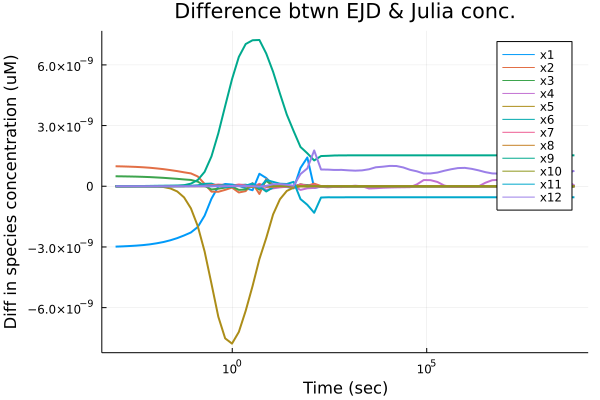

In [20]:
# WORK FROM HERE!! -LL
# Also plot the difference 
# calculate the differences in each species concentration at each time point between Julia code and EJD output
time_julia = sol.t
time_ejd = matrix1[:,1]

# Extract out vectors for each species 
allSlns = sol.u
x1_jul=[]; x2_jul=[]; x3_jul=[]; x4_jul=[]; x5_jul=[]; x6_jul=[];
x7_jul=[]; x8_jul=[]; x9_jul=[]; x10_jul=[]; x11_jul=[]; x12_jul=[];

for sl in allSlns # for each time point 
    # take the vector of all species concentrations
    x1Item = sl[1]; x2Item = sl[2]; x3Item = sl[3]; x4Item = sl[4]; x5Item = sl[5]; x6Item = sl[6];
    x7Item = sl[7]; x8Item = sl[8]; x9Item = sl[9]; x10Item = sl[10]; x11Item = sl[11]; x12Item = sl[12];
    
    push!(x1_jul, x1Item);push!(x2_jul, x2Item);push!(x3_jul, x3Item)
    push!(x4_jul, x4Item);push!(x5_jul, x5Item);push!(x6_jul, x6Item)
    push!(x7_jul, x7Item);push!(x8_jul, x8Item);push!(x9_jul, x9Item)
    push!(x10_jul, x10Item);push!(x11_jul, x11Item);push!(x12_jul, x12Item)    
end 

# calculate difference between each species 
diff_x1 = x1 .- x1_jul; diff_x2 = x2 .- x2_jul; diff_x3 = x3 .- x3_jul;
diff_x4 = x4 .- x4_jul; diff_x5 = x5 .- x5_jul; diff_x6 = x6 .- x6_jul;
diff_x7 = x7 .- x7_jul; diff_x8 = x8 .- x8_jul; diff_x9 = x9 .- x9_jul;
diff_x10 = x10 .- x10_jul; diff_x11 = x11 .- x11_jul; diff_x12 = x12 .- x12_jul;

diffMat = hcat(diff_x1,diff_x2,diff_x3,diff_x4,diff_x5,diff_x6, diff_x7,diff_x8, diff_x9, diff_x10, diff_x11, diff_x12)
# Now plot the differences

pDiff=plot(time_julia, diffMat,linewidth=2,title="Difference btwn EJD & Julia conc.",xaxis = ("Time (sec)",:log ),
     yaxis="Diff in species concentration (uM)", label = ["x1" "x2" "x3" "x4" "x5" "x6" "x7" "x8" "x9" "x10" "x11" "x12"] ) # legend=false


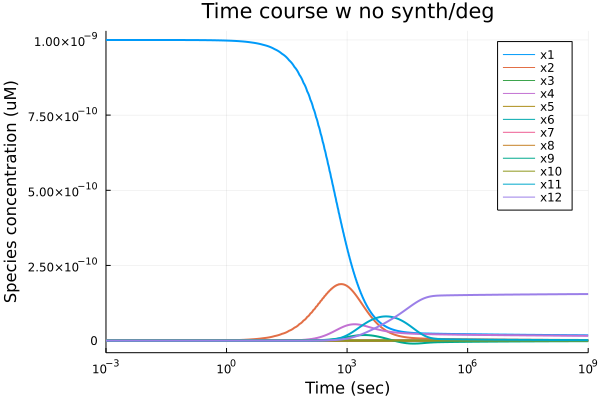

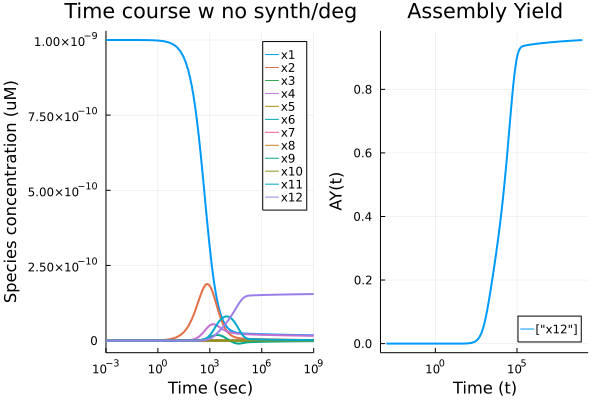

Plot done!


In [71]:
#-------------------------------
# --- parameter values here ---
#-------------------------------
c0=1 # 1M
kd1 = 10^-12 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-3 #between ring (intra)
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 

#x0Val=10^-8; # x0 M
x0Val=10^-9
paramvaluesList= x0Val, kOn, δ, Q, kd1, kd2

#---------------------------------
# --- solve fixed parameter ex ---
#---------------------------------
sol = StackedRings_EJD(paramvaluesList)
p1=plot(sol,linewidth=2,title="Time course w no synth/deg",xaxis = ("Time (sec)",:log ),
     yaxis="Species concentration (uM)", label = ["x1" "x2" "x3" "x4" "x5" "x6" "x7" "x8" "x9" "x10" "x11" "x12"] ) # legend=false

display(p1)

aytc_01 = AYtimeCourse(sol);
list_AY=aytc_01[1]; timePts=aytc_01[2]
p2=plot(timePts,list_AY,linewidth=2,title="Assembly Yield",xaxis = ("Time (t)",:log ),
         yaxis="AY(t)", label = ["x12"], legend=:bottomright )

# --- plot AY time course as well --- 
p3=plot(p1,p2, layout=2)
display(p3)
println("Plot done!")

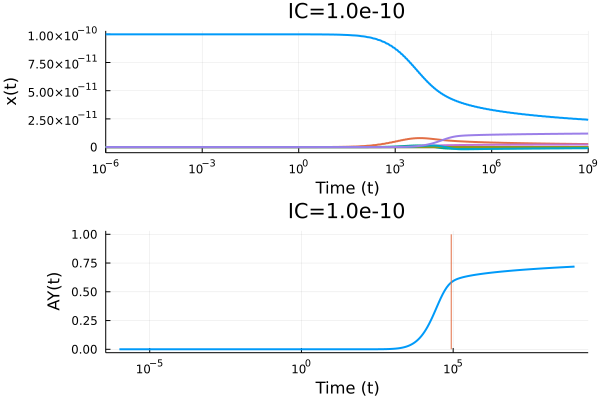

done

In [4]:
#---------------------------------
# --- IC vs AY curve DEBUGGING ---
#---------------------------------

# LL -- AY 

# Plot TC + AY tc  

# fixed parameters
c0=1 # 1M
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 
kd1 = 10^-12
kd2 = 10^-3

#allICs = [4*10^-6, 10^-10, 10^-4]
allICs = [10^-10, 10^-4]

x0Val=allICs[1];x0Val_str=round(x0Val, digits = 10)
paramvaluesList_1 = x0Val, kOn, δ, Q, kd1, kd2
sol_IC_1 = StackedRings_EJD(paramvaluesList_1)
tc_p1=plot(sol_IC_1,linewidth=2,title="IC=$x0Val_str",xaxis = ("Time (t)",:log ),
     yaxis="x(t)", legend=false ) # legend=false

timePts = sol_IC_1.t; allSols = sol_IC_1.u; # list of all solutions 
# plot AY tc 
totPts = length(timePts); #print("Time points: ", totPts)
list_AY=[]; n=6 
XT = x0Val
for tp_i = 1:totPts
    slntEnd_pre = allSols[tp_i,:]; # println("prevec: ", slntEnd_pre)
    slntEnd = slntEnd_pre[1]; #println("Sln: ", slntEnd); println("-----")
    # --- calculate Xn = X12 ---
    Xn = slntEnd[12]; #println("Xn: ", Xn)
    # --- calculate Yn ---
    Yn = n*Xn/XT; # add this to the AY list
    push!(list_AY, Yn)
end 

tc_p1_ay=plot(timePts,list_AY,linewidth=2,title="IC=$x0Val_str",xaxis = ("Time (t)",:log ),
     yaxis="AY(t)", legend=false ) # legend=false
plot!([86400,86400],[0,1])

p1_plot=plot(tc_p1, tc_p1_ay, layout=(2,1))
display(p1_plot)


print("done")

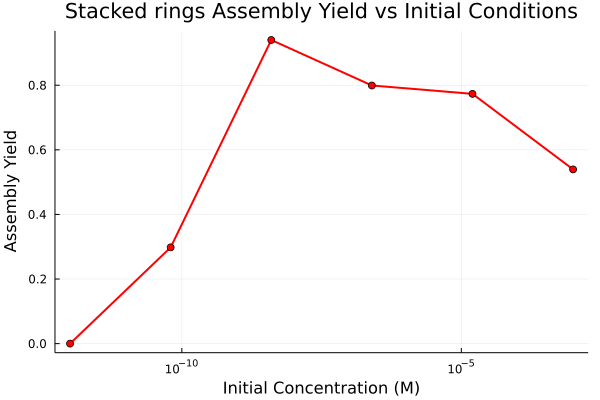

Red done!


In [2]:
#-------------------------------
# --- IC vs AY curve ---
#-------------------------------

# IC vs Ay --- LL 

# fixed parameters
c0=1 # 1M
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 

nICpts=6;minDeg=-12; maxDeg=-3

# --- change these to generate highlighted curves --- 
# - red curve -
kd1 = 10^-3 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-12 #between ring (intra)
allAYvsIC_red = calcAYvsIC(nICpts,minDeg, maxDeg)
println("Red done!")

allICs= allAYvsIC_red[1]; AYvals=allAYvsIC_red[2]

mycolors = [:red :green :orange :blue :purple]
p3_curve_1=plot(allICs,AYvals,linewidth=2, linecolor=:match, markershape=:circle, color = mycolors,title="Stacked rings Assembly Yield vs Initial Conditions",xaxis = ("Initial Concentration (M)",:log ),
         yaxis="Assembly Yield",legend=false ) # legend=false
display(p3_curve_1)

# plot the associated time course plots for each of these IC values 
# only do this for the 5 pts!

# get time courses for each point in the red curve here 
x0Val=allICs[1];x0Val_str=round(x0Val, digits = 10)
paramvaluesList_1= x0Val, kOn, δ, Q, kd1, kd2
sol_IC_1 = StackedRings_EJD(paramvaluesList_1)
tc_p1=plot(sol_IC_1,linewidth=2,title="IC=$x0Val_str",xaxis = ("Time (t)",:log ),
     yaxis="x(t)", legend=false ) # legend=false

x0Val=allICs[2];x0Val_str=round(x0Val, digits = 10)
paramvaluesList_2= x0Val, kOn, δ, Q, kd1, kd2
sol_IC_2 = StackedRings_EJD(paramvaluesList_2)
tc_p2=plot(sol_IC_2,linewidth=2,title="IC=$x0Val_str",xaxis = ("Time (t)",:log ),
     yaxis="x(t)", legend=false ) # legend=false

x0Val=allICs[3];x0Val_str=round(x0Val, digits = 10)
paramvaluesList_3= x0Val, kOn, δ, Q, kd1, kd2
sol_IC_3 = StackedRings_EJD(paramvaluesList_3)
tc_p3=plot(sol_IC_3,linewidth=2,title="IC=$x0Val_str",xaxis = ("Time (t)",:log ),
     yaxis="x(t)", legend=false ) # legend=false

x0Val=allICs[4];x0Val_str=round(x0Val, digits = 10)
paramvaluesList_4= x0Val, kOn, δ, Q, kd1, kd2
sol_IC_4 = StackedRings_EJD(paramvaluesList_4)
tc_p4=plot(sol_IC_3,linewidth=2,title="IC=$x0Val_str",xaxis = ("Time (t)",:log ),
     yaxis="x(t)", legend=false ) # legend=false

x0Val=allICs[5];x0Val_str=round(x0Val, digits = 10)
paramvaluesList_5= x0Val, kOn, δ, Q, kd1, kd2
sol_IC_5 = StackedRings_EJD(paramvaluesList_5)
tc_p5=plot(sol_IC_5,linewidth=2,title="IC=$x0Val_str",xaxis = ("Time (t)",:log ),
     yaxis="x(t)", legend=false ) # legend=false

x0Val=allICs[6];x0Val_str=round(x0Val, digits = 10)
paramvaluesList_6= x0Val, kOn, δ, Q, kd1, kd2
sol_IC_6 = StackedRings_EJD(paramvaluesList_6)
tc_p6=plot(sol_IC_6,linewidth=2,title="IC=$x0Val_str",xaxis = ("Time (t)",:log ),
     yaxis="x(t)", legend=false ) # legend=false

plot(tc_p1,tc_p2,tc_p3,tc_p4,tc_p5,tc_p6, layout = (3,2))

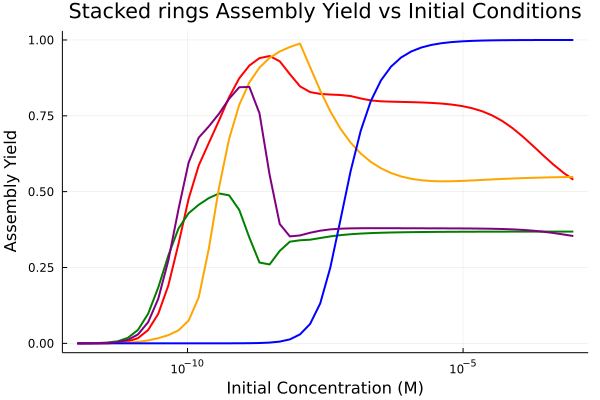

In [3]:
#-------------------------------
# --- IC vs AY curve ---
#-------------------------------

# IC vs Ay --- LL 

# fixed parameters
c0=1 # 1M
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 

nICpts=50;minDeg=-12; maxDeg=-3

# --- change these to generate highlighted curves --- 
# - red curve -
kd1 = 10^-3 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-12 #between ring (intra)
allAYvsIC_red = calcAYvsIC(nICpts,minDeg, maxDeg)
# println("Red done!")

allICs_red= allAYvsIC_red[1]; AYvals=allAYvsIC_red[2]

mycolors = [:red :green :orange :blue :purple]
p3_curve=plot(allICs_red,AYvals,linewidth=2, linecolor=:match, color = mycolors,title="Stacked rings Assembly Yield vs Initial Conditions",xaxis = ("Initial Concentration (M)",:log ),
         yaxis="Assembly Yield",legend=false ) # legend=false

# - green curve -
kd1 = 10^-12 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-12 #between ring (intra)
allAYvsIC_green = calcAYvsIC(nICpts,minDeg, maxDeg)
# println("Red done!")

allICs_green= allAYvsIC_green[1]; AYvals=allAYvsIC_green[2]
plot!(allICs_green,AYvals,linewidth=2, linecolor=:green, color = mycolors,title="Stacked rings Assembly Yield vs Initial Conditions",xaxis = ("Initial Concentration (M)",:log ),
         yaxis="Assembly Yield",legend=false ) # legend=false

# - orange curve -
kd1 = 10^-8 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-8 #between ring (intra)
allAYvsIC_orange = calcAYvsIC(nICpts,minDeg, maxDeg)
# println("Red done!")

allICs_orange= allAYvsIC_orange[1]; AYvals=allAYvsIC_orange[2]
plot!(allICs_orange,AYvals,linewidth=2, linecolor=:orange, color = mycolors,title="Stacked rings Assembly Yield vs Initial Conditions",xaxis = ("Initial Concentration (M)",:log ),
         yaxis="Assembly Yield",legend=false ) # legend=false

# - blue curve -
kd1 = 10^-3 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-3 #between ring (intra)
allAYvsIC_blue = calcAYvsIC(nICpts,minDeg, maxDeg)
# println("Red done!")

allICs_blue= allAYvsIC_blue[1]; AYvals=allAYvsIC_blue[2]
plot!(allICs_blue,AYvals,linewidth=2, linecolor=:blue, color = mycolors,title="Stacked rings Assembly Yield vs Initial Conditions",xaxis = ("Initial Concentration (M)",:log ),
         yaxis="Assembly Yield",legend=false ) # legend=false

# - purple curve -
kd1 = 10^-12 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-3 #between ring (intra)
allAYvsIC_purple = calcAYvsIC(nICpts,minDeg, maxDeg)
# println("Red done!")

allICs_purple= allAYvsIC_purple[1]; AYvals=allAYvsIC_purple[2]
plot!(allICs_purple,AYvals,linewidth=2, linecolor=:purple, color = mycolors,title="Stacked rings Assembly Yield vs Initial Conditions",xaxis = ("Initial Concentration (M)",:log ),
         yaxis="Assembly Yield",legend=false ) # legend=false

display(p3_curve)

In [15]:
#-------------------------------
# --- IC vs AY curve ---
#-------------------------------

# IC vs Ay --- LL 
# with a lot of parameter sweeps! (gray lines in Koan thesis)

# fixed parameters
c0=1 # 1M
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 

nICpts=15;minDeg=-12; maxDeg=-3 # will need 125 curves (15 and 15 for each kd)

# make a vector that holds all the Kd's - log normally distributed on each direction 
AllKD1s = [];AllKD2s = []
for i in LinRange(minDeg, maxDeg,nICpts)#start, stop, number of steps
    kd1=10^i;kd2=10^i
    push!(AllKD1s, kd1)
    push!(AllKD2s, kd2)
end

# loop through all Kds and calculate AY for each pair with that IC 
for kd1 in AllKD1s
    for kd2 in AllKD2s
        # calculate AY vs IC for this choice of kd1 and kd2 and save the curve 
        
    end 
end 

#kd1 = 10^-3 #within a ring (inter) #the bigger the KD to weaker
#kd2 = 10^-12 #between ring (intra)
#allAYvsIC_red = calcAYvsIC(nICpts,minDeg, maxDeg) # this function returns one curve for fixed kd1/2















1.0e-12

4.393970560760804e-12

1.9306977288832457e-11

8.483428982440725e-11

3.727593720314938e-10

1.6378937069540679e-9

7.1968567300115284e-9

3.162277660168379e-8

1.389495494373136e-7

6.105402296585339e-7

2.6826957952797274e-6

1.1787686347935867e-5

5.179474679231202e-5

0.00022758459260747912

0.001
kd1: 1.0e-12

1.0e-12

4.393970560760804e-12

1.9306977288832457e-11

8.483428982440725e-11

3.727593720314938e-10

1.6378937069540679e-9

7.1968567300115284e-9

3.162277660168379e-8

1.389495494373136e-7

6.105402296585339e-7

2.6826957952797274e-6

1.1787686347935867e-5

5.179474679231202e-5

0.00022758459260747912

0.001
kd1: 4.393970560760804e-12

1.0e-12

4.393970560760804e-12

1.9306977288832457e-11

8.483428982440725e-11

3.727593720314938e-10

1.6378937069540679e-9

7.1968567300115284e-9

3.162277660168379e-8

1.389495494373136e-7

6.105402296585339e-7

2.6826957952797274e-6

1.1787686347935867e-5

5.179474679231202e-5

0.00022758459260747912

0.001
kd1: 1.93069772888324

In [38]:
#----------------
#--- KD1 v AY ---
#----------------
# by PM

# fixed parameters
#-------------------------------
# --- parameter values here ---
#-------------------------------
c0=1 # 1M
#kd1 = 10^-3 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-8 #between ring (intra)
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 
x0Val=10^-8; # x0 M

#--- if kd1 remains defined globally uncomment
#kd1= nothing #clears kd1 value globally
#GC.gc() #runs garbage collector

function calcAYvsKD1(nKD1,minKD1, maxKD1) #number of steps, min, max
    # this function will calculate AY for different KD1 (inter) values at each time point but only for the x12 species 
    # nIKD1 = number of initial condition points to consider
    AllKD1s = []
    for i in LinRange(minKD1, maxKD1,nKD1)#start, stop, number of steps
        KD1=10^i
        push!(AllKD1s, KD1)
    end
    println(AllKD1s)

    # initialize lists to store
    AY_list = []
    # loop to solve AY for each KD 
    #println("before for loop is good")
    for KD1s in AllKD1s # loop through all the KD1 values
        kd1=KD1s
        println(kd1)
        println("-")
        paramvaluesList= x0Val, kOn, δ, Q, kd1, kd2
        sol = StackedRings_EJD(paramvaluesList);
        # calculate AY 
        ayVali = assemblyYield(sol); print(ayVali)
        println("*")
        # store value of AY 
        push!(AY_list, ayVali)
    end 
    
    return AllKD1s, AY_list
    
end


calcAYvsKD1(3,4,6)#number of steps, min, max


AY_list=[]
c0=1 # 1M
kd2 = 10^-6 #between ring (intra)
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 
x0Val=10^-8; # x0 M


Any[10000.0, 100000.0, 1.0e6]
10000.0
-
1.9598394302327463e-15*
100000.0
-
1.959069146748916e-21*
1.0e6
-
1.959975796723229e-27*


In [3]:
# DEBUGGING AY VALUES 

#from Eric -- ran on python
matrix1=[0.001	0.997006	0.00199103	0.000995012	1.4906e-06	2.98067e-06	2.98067e-06	6.25092e-09	2.08383e-09	4.16712e-09	2.08383e-09	1.77753e-11	1.05907e-14
0.0015	0.995515	0.00297984	0.0014888	3.34418e-06	6.6866e-06	6.6866e-06	2.04445e-08	6.81559e-09	1.36286e-08	6.81559e-09	8.29759e-11	7.02352e-14
0.00225	0.993283	0.00445475	0.00222485	7.49149e-06	1.49772e-05	1.49772e-05	6.76242e-08	2.25446e-08	4.50766e-08	2.25446e-08	4.01257e-10	4.97099e-13
0.003375	0.989949	0.00664852	0.00331863	1.67438e-05	3.34684e-05	3.34684e-05	2.25313e-07	7.51194e-08	1.50176e-07	7.51194e-08	1.99385e-09	3.6988e-12
0.0050625	0.984978	0.0098978	0.00493636	3.72973e-05	7.45308e-05	7.45308e-05	7.50195e-07	2.50137e-07	4.99961e-07	2.50137e-07	9.8813e-09	2.70864e-11
0.00759375	0.977589	0.0146801	0.0073123	8.26671e-05	0.000165124	0.000165124	2.48502e-06	8.28698e-07	1.65584e-06	8.28698e-07	4.87173e-08	1.97772e-10
0.0113906	0.966655	0.0216524	0.0107652	0.000181874	0.000363061	0.000363061	8.15796e-06	2.72109e-06	5.43454e-06	2.72109e-06	2.38566e-07	1.44208e-09
0.0170859	0.950584	0.0316739	0.0157044	0.00039577	0.000789337	0.000789337	2.64238e-05	8.81664e-06	1.75962e-05	8.81664e-06	1.15073e-06	1.03537e-08
0.0256289	0.927197	0.0457745	0.0226041	0.000847427	0.00168796	0.00168796	8.39077e-05	2.80114e-05	5.58469e-05	2.80114e-05	5.42463e-06	7.23779e-08
0.0384434	0.893657	0.0649892	0.0319046	0.00177229	0.00352376	0.00352376	0.000258865	8.64883e-05	0.000172167	8.64883e-05	2.47222e-05	4.86961e-07
0.057665	0.846579	0.0899416	0.0437844	0.00358308	0.00710654	0.00710654	0.000766232	0.000256326	0.000509087	0.000256326	0.000107339	3.09907e-06
0.0864976	0.782515	0.120061	0.0577611	0.00690645	0.0136544	0.0136544	0.00213988	0.00071728	0.00141983	0.00071728	0.000435389	1.82369e-05
0.129746	0.69907	0.152525	0.0722082	0.0124718	0.0245634	0.0245634	0.00552123	0.00185653	0.00365734	0.00185653	0.00160985	9.64478e-05
0.19462	0.596725	0.181561	0.0841555	0.0206791	0.0405649	0.0405649	0.0128497	0.00434208	0.00849658	0.00434208	0.00527591	0.00044366
0.291929	0.480727	0.199394	0.0899967	0.0308653	0.0603472	0.0603472	0.0263525	0.00897195	0.0173984	0.00897195	0.0149088	0.00171829
0.437894	0.361457	0.199708	0.0873076	0.0408776	0.0798242	0.0798242	0.0468218	0.0161175	0.0308959	0.0161175	0.0355854	0.00546388
0.656841	0.251694	0.181809	0.0766082	0.0478647	0.093683	0.093683	0.0717374	0.0250778	0.047404	0.0250778	0.0712426	0.0141185
0.985261	0.161681	0.151512	0.061225	0.0500488	0.0986221	0.0986221	0.0957492	0.0341649	0.0635579	0.0341649	0.120769	0.0298835
1.47789	0.0955702	0.117441	0.0452067	0.0477465	0.0951245	0.0951245	0.113815	0.0416829	0.0762193	0.0416829	0.177358	0.0530287
2.21684	0.0516948	0.0864541	0.0313374	0.0427196	0.0862394	0.0862394	0.12382	0.0468184	0.0841284	0.0468184	0.232351	0.0813783
3.32526	0.0253086	0.0617845	0.0206375	0.0368703	0.0752487	0.0752487	0.126527	0.0496991	0.0878759	0.0496991	0.279586	0.111514
4.98789	0.0111482	0.0437878	0.0129351	0.0314663	0.0642769	0.0642769	0.123934	0.0508951	0.0888943	0.0508951	0.316965	0.140526
7.48183	0.00465843	0.0314355	0.00760562	0.0270472	0.0541178	0.0541178	0.117812	0.050919	0.0885625	0.050919	0.345649	0.167156
11.2227	0.00228641	0.0234336	0.00405148	0.0236389	0.0446933	0.0446933	0.109077	0.0499734	0.0877965	0.0499734	0.368442	0.191941
16.8341	0.00159545	0.0186914	0.00185526	0.0209874	0.035684	0.035684	0.0978164	0.0479648	0.0870247	0.0479648	0.388299	0.216433
25.2512	0.00133279	0.0162708	0.000686602	0.0187004	0.0270094	0.0270094	0.0837187	0.0446949	0.0863578	0.0446949	0.407411	0.242113
37.8768	0.00110151	0.0152404	0.000193878	0.0163181	0.0189517	0.0189517	0.0667165	0.0400612	0.0857875	0.0400612	0.426902	0.269714
56.8151	0.000839691	0.0147941	4.20418e-05	0.0134593	0.0120156	0.0120156	0.0477402	0.0341898	0.0853768	0.0341898	0.446618	0.298719
85.2227	0.000558938	0.0144419	8.85618e-06	0.0100447	0.00667334	0.00667334	0.029144	0.0275353	0.0854943	0.0275353	0.465152	0.326738
127.834	0.00029946	0.0139412	2.14236e-06	0.00640265	0.00310559	0.00310559	0.0141097	0.0208756	0.0869455	0.0208756	0.480618	0.349719
191.751	0.000114894	0.0130969	3.49598e-07	0.00319439	0.00112138	0.00112138	0.00487725	0.0150237	0.0906785	0.0150237	0.491583	0.364165
287.627	2.73093e-05	0.0117181	2.48542e-08	0.00109744	0.000274912	0.000274912	0.00104258	0.010347	0.0969932	0.010347	0.497581	0.370297
431.44	3.47746e-06	0.00977098	1.13587e-09	0.000223973	3.79619e-05	3.79619e-05	0.000115254	0.00665431	0.104953	0.00665431	0.499719	0.371831
647.16	2.63239e-07	0.00746727	5.90883e-11	2.48397e-05	2.72687e-06	2.72687e-06	5.30887e-06	0.00373963	0.112845	0.00373963	0.500137	0.372036
970.74	5.52346e-08	0.00515809	6.09742e-12	1.67298e-06	3.23509e-07	3.23509e-07	7.65682e-08	0.00171869	0.119165	0.00171869	0.500178	0.372059
1456.11	2.76292e-08	0.00321389	2.02991e-12	1.2334e-07	1.1061e-07	1.1061e-07	2.32229e-10	0.000633798	0.12327	0.000633798	0.500178	0.37207
2184.16	1.39007e-08	0.00185862	6.45161e-13	2.48763e-08	3.52979e-08	3.52979e-08	5.98784e-13	0.000199597	0.125488	0.000199597	0.500175	0.372079
3276.25	7.19173e-09	0.00105149	1.93473e-13	1.07039e-08	1.06177e-08	1.06177e-08	9.88742e-14	6.06248e-05	0.126568	6.06248e-05	0.500174	0.372085
4914.37	3.94519e-09	0.000606062	6.10626e-14	5.75929e-09	3.35872e-09	3.35872e-09	2.09779e-14	1.94333e-05	0.127093	1.94333e-05	0.500172	0.37209
7371.55	2.28524e-09	0.000360568	2.09127e-14	3.35483e-09	1.15196e-09	1.15196e-09	5.38966e-15	6.72977e-06	0.127361	6.72977e-06	0.500171	0.372095
11057.3	1.37896e-09	0.000220847	7.68848e-15	2.04046e-09	4.23885e-10	4.23885e-10	1.64682e-15	2.49171e-06	0.127506	2.49171e-06	0.50017	0.372099
16586	8.56198e-10	0.000138323	2.97932e-15	1.27592e-09	1.64344e-10	1.64344e-10	0	9.69766e-07	0.127589	9.69766e-07	0.500169	0.372102
24879	5.41929e-10	8.8013e-05	1.19706e-15	8.12814e-10	6.60528e-11	6.60528e-11	0	3.90708e-07	0.127638	3.90708e-07	0.500168	0.372106
37318.5	3.47245e-10	5.65794e-05	0	5.24317e-10	2.71708e-11	2.71708e-11	0	1.60969e-07	0.127668	1.60969e-07	0.500167	0.372109
55977.7	2.24038e-10	3.65798e-05	0	3.41011e-10	1.13226e-11	1.13226e-11	0	6.71531e-08	0.127686	6.71531e-08	0.500166	0.372112
83966.6	1.44861e-10	2.36836e-05	0	2.22483e-10	4.73865e-12	4.73865e-12	0	2.81187e-08	0.127697	2.81187e-08	0.500165	0.372115
125950	9.34617e-11	1.52934e-05	0	1.45379e-10	1.97303e-12	1.97303e-12	0	1.17127e-08	0.127703	1.17127e-08	0.500164	0.372118
188925	5.98572e-11	9.80008e-06	0	9.59581e-11	8.09911e-13	8.09911e-13	0	4.80914e-09	0.127707	4.80914e-09	0.500163	0.372121
283387	3.77743e-11	6.18684e-06	0	6.22005e-11	3.22298e-13	3.22298e-13	0	1.91408e-09	0.127708	1.91408e-09	0.500162	0.372123
425081	2.32797e-11	3.81375e-06	0	4.03163e-11	1.22214e-13	1.22214e-13	0	7.25933e-10	0.127709	7.25933e-10	0.500161	0.372126
637622	1.37991e-11	2.26097e-06	0	2.6504e-11	4.29186e-14	4.29186e-14	0	2.54951e-10	0.127709	2.54951e-10	0.500161	0.372128
956432	7.66707e-12	1.25637e-06	0	1.72361e-11	1.29218e-14	1.29218e-14	0	7.67635e-11	0.127709	7.67635e-11	0.50016	0.37213
1.43465e+06	3.83086e-12	6.27781e-07	0	1.15006e-11	3.34589e-15	3.34589e-15	0	1.98779e-11	0.127708	1.98779e-11	0.50016	0.372132
2.15197e+06	1.61368e-12	2.6445e-07	0	8.61582e-12	0	0	0	3.50791e-12	0.127708	3.50791e-12	0.500159	0.372133
3.22796e+06	5.04075e-13	8.26095e-08	0	6.92742e-12	0	0	0	2.81275e-13	0.127708	2.81275e-13	0.500159	0.372133
4.84194e+06	9.65645e-14	1.58255e-08	0	6.31079e-12	0	0	0	0	0.127707	0	0.500159	0.372134
7.26291e+06	8.41424e-15	1.37893e-09	0	6.17728e-12	0	0	0	1.89055e-14	0.127707	1.89055e-14	0.500159	0.372134
1.08944e+07	0	1.06218e-10	0	6.16586e-12	0	0	0	9.35096e-15	0.127707	9.35096e-15	0.500159	0.372134
1.63415e+07	0	8.08916e-11	0	6.15667e-12	0	0	0	0	0.127707	0	0.500159	0.372134
2.45123e+07	0	0	0	6.15859e-12	0	0	0	2.27745e-14	0.127707	2.27745e-14	0.500159	0.372134
3.67685e+07	0	0	0	6.14861e-12	0	0	0	0	0.127707	0	0.500159	0.372134
5.51527e+07	2.89095e-15	4.73927e-10	0	6.1474e-12	0	0	0	0	0.127707	0	0.500159	0.372134
8.27291e+07	0	0	0	6.15979e-12	0	0	0	0	0.127707	0	0.500159	0.372134
1.24094e+08	0	0	0	6.15803e-12	0	0	0	0	0.127707	0	0.500159	0.372134
1.8614e+08	0	0	0	6.15551e-12	0	0	0	0	0.127707	0	0.500159	0.372134
2.79211e+08	0	7.54518e-14	0	6.152e-12	0	0	0	0	0.127707	0	0.500159	0.372134
4.18816e+08	0	3.86527e-15	0	6.14674e-12	0	0	0	0	0.127707	0	0.500159	0.372134
6.28224e+08	0	1.22493e-15	0	6.13887e-12	0	0	0	0	0.127707	0	0.500159	0.372134
9.42336e+08	0	0	0	6.1271e-12	0	0	0	0	0.127707	0	0.500159	0.372134
1.4135e+09	0	0	0	6.10951e-12	0	0	0	0	0.127707	0	0.500159	0.372134
2.12026e+09	0	0	0	6.08313e-12	0	0	0	0	0.127707	0	0.500159	0.372134
3.18038e+09	0	0	0	6.04356e-12	0	0	0	0	0.127707	0	0.500159	0.372134
4.77057e+09	0	0	0	5.98444e-12	0	0	0	0	0.127707	0	0.500159	0.372134
7.15586e+09	0	0	0	5.8962e-12	0	0	0	0	0.127707	0	0.500159	0.372134
1.07338e+10	0	0	0	5.76385e-12	0	0	0	0	0.127707	0	0.500159	0.372134
1.61007e+10	0	0	0	5.56531e-12	0	0	0	0	0.127707	0	0.500159	0.372134
2.4151e+10	0	0	0	5.26765e-12	0	0	0	0	0.127707	0	0.500159	0.372134
3.62265e+10	0	0	0	4.82248e-12	0	0	0	0	0.127707	0	0.500159	0.372134
5.43398e+10	0	0	0	4.15473e-12	0	0	0	0	0.127707	0	0.500159	0.372134
8.15097e+10	0	0	0	3.1531e-12	0	0	0	0	0.127707	0	0.500159	0.372134
1.22265e+11	0	0	0	1.65066e-12	0	0	0	0	0.127707	0	0.500159	0.372134
1.83397e+11	0	0	0	0	0	0	0	0	0.127707	0	0.500159	0.372134
2.75095e+11	0	0	0	0	0	0	0	0	0.127707	0	0.500159	0.372134
4.12643e+11	0	0	0	0	0	0	0	0	0.127707	0	0.500159	0.372134
6.18965e+11	0	0	0	0	0	0	0	0	0.127707	0	0.500159	0.372134
9.28447e+11	0	0	0	0	0	0	0	0	0.127707	0	0.500159	0.372134]

86×13 Matrix{Float64}:
 0.001       0.997006  0.00199103  0.000995012  …  1.77753e-11  1.05907e-14
 0.0015      0.995515  0.00297984  0.0014888       8.29759e-11  7.02352e-14
 0.00225     0.993283  0.00445475  0.00222485      4.01257e-10  4.97099e-13
 0.003375    0.989949  0.00664852  0.00331863      1.99385e-9   3.6988e-12
 0.0050625   0.984978  0.0098978   0.00493636      9.8813e-9    2.70864e-11
 0.00759375  0.977589  0.0146801   0.0073123    …  4.87173e-8   1.97772e-10
 0.0113906   0.966655  0.0216524   0.0107652       2.38566e-7   1.44208e-9
 0.0170859   0.950584  0.0316739   0.0157044       1.15073e-6   1.03537e-8
 0.0256289   0.927197  0.0457745   0.0226041       5.42463e-6   7.23779e-8
 0.0384434   0.893657  0.0649892   0.0319046       2.47222e-5   4.86961e-7
 0.057665    0.846579  0.0899416   0.0437844    …  0.000107339  3.09907e-6
 0.0864976   0.782515  0.120061    0.0577611       0.000435389  1.82369e-5
 0.129746    0.69907   0.152525    0.0722082       0.00160985   9.64478e

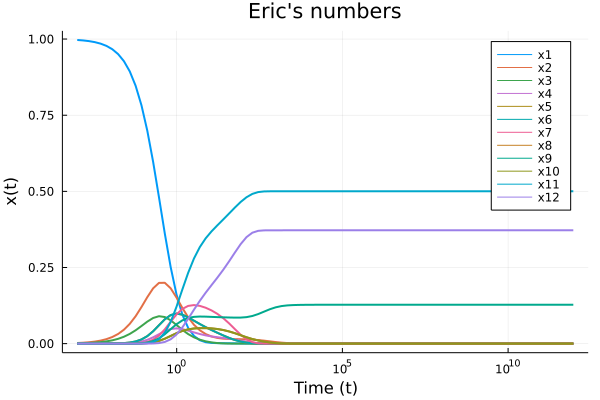

Keff in Julia
Kf(1,0)= 1.0000000000000006e-6
Kf(0,1)= 1000.0000000000002
Kf(1,1)= 3.0590232050182605e-16
Kf(2,0)= 3.0590232050182615e-25
Kf(2,1)= 9.357622968840188e-35
Kf(0,2)= 3.0590232050182594e-7
Kf(2,2)= 2.8625185805493984e-44
Kf(3,0)= 9.357622968840193e-44
Kf(0,3)= 9.357622968840181e-17
Kf(4,0)= 2.8625185805494008e-62
Kf(4,1)= 8.756510762696543e-72


In [21]:
# show(matrix1[3,2])

# the parameters used to generate this plot were:
# kd1 = 10^-12, kd2=10^-3, kOn =10^6, IC = 10^-6
p2=plot((matrix1[:,1],matrix1[:,2:13]),linewidth=2,title="Eric's numbers",xaxis = ("Time (t)",:log ),
yaxis="x(t)", label = ["x1" "x2" "x3" "x4" "x5" "x6" "x7" "x8" "x9" "x10" "x11" "x12"], plotjoined=true) # legend=false


# To compare: 
c0=1 # 1M
kd1 = 10^-12 #within a ring (inter) #the bigger the KD to weaker
kd2 = 10^-3 #between ring (intra)
kOn = 10^6 # 10^6 M^-1 s^-1
ΔGp = 9 # 9kcal/M
Rconst = 1.98/1000 #Boltzman constant in J mol^-1 K^-1
T = 300 # in Kelvin (K)
Q = 0; δ = 0;  # synthesis and degradation 
x0Val=10^-6

paramvaluesList= x0Val, kOn, δ, Q, kd1, kd2
sol = StackedRings_EJD(paramvaluesList)
p1=plot(sol,linewidth=2,title="Our time course in Julia",xaxis = ("Time (sec)",:log ),
     yaxis="Species concentration (uM)", label = ["x1" "x2" "x3" "x4" "x5" "x6" "x7" "x8" "x9" "x10" "x11" "x12"] ) # legend=false

display(p1)
display(p2)



